## Assignment 2:

### Required Libraries

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
import string, os, sys
from tqdm import tqdm

### Python open CV version used

In [2]:
# !pip install opencv-python==3.4.2.16
# !pip3 install opencv-contrib-python==3.3.0.9

## 1. Image Mosaicing

    Images in Image Mosaicing directory

In [159]:
# !ls ../images/Image\ Mosaicing
list_of_images = os.listdir('../images/Image Mosaicing')
image_list = {}
for image in list_of_images:
    p, ind = image.split('_')
    if p in image_list:
        image_list[p].append(image)
    else:
        image_list[p] = [image]
image_list

{'1': ['1_3.jpg', '1_1.jpg', '1_2.jpg', '1_4.jpg'],
 '2': ['2_6.png', '2_3.png', '2_5.png', '2_4.png', '2_1.png', '2_2.png'],
 '3': ['3_1.png', '3_2.png'],
 '4': ['4_1.jpg', '4_2.jpg'],
 '5': ['5_2.jpg', '5_1.jpg', '5_4.jpg', '5_3.jpg']}

### Function to load images and scale them if required

In [175]:
def load_image(path, image_name, scale):
    img = cv2.imread(path + "/" + image_name)
#     print(image_path + "/" + image_name)
    img = cv2.resize(img, (int(img.shape[1] * scale), int(img.shape[0] * scale)))
    return img

# cv2.imshow("res", res)
# cv2.waitKey(0)  
# cv2.destroyAllWindows()

### Function returns keypoints and good points  
1. To apply Sift for finding keypoints and descriptors
2. Using BFMatcher to find good matches

In [70]:
def apply_sift_and_find_good_matches(img1, img2, var):
    gray1= cv2.cvtColor(img1,cv2.COLOR_BGR2GRAY)
    gray2= cv2.cvtColor(img2,cv2.COLOR_BGR2GRAY)

    sift = cv2.xfeatures2d.SIFT_create()

    keypoints_1, descriptors_1 = sift.detectAndCompute(img1,None)
    keypoints_2, descriptors_2 = sift.detectAndCompute(img2,None)
    
    match = cv2.BFMatcher()
    matches = match.knnMatch(descriptors_1, descriptors_2, k=2)

    good_points = []
    for m, n in matches:
        if m.distance < var * n.distance :
            good_points.append(m)
            
    return keypoints_1, keypoints_2, good_points

def draw_matches(img1, kp1, img2, kp2, good_points):
    draw_parameters = dict(matchColor = (0, 255, 0), singlePointColor=None, flags=2)
    img3 = cv2.drawMatches(img1, kp1, img2, kp2, good_points, None, **draw_parameters)
    
    plt.imshow(img3)

### Function for finding homography matrix

In [19]:
def find_homography_matrix(p_left, p_right, iters):
    finest_H = []
    max_inliers = 0
    threshold = 5
    for it in tqdm(range(iters)):
        # Choose random points
        indices = np.random.choice(p_left.shape[0], 4)
        M = []
        for i in indices:
            X1, Y1 = p_left[i]
            X2, Y2 = p_right[i]
            M.append([X1, Y1, 1, 0, 0, 0, -X2*X1, -X2*Y1, -X2])
            M.append([0, 0, 0, X1, Y1, 1, -Y2*X1, -Y2*Y1, -Y2])

        M = np.array(M)

        #svd decomposition
        u, s, vt = np.linalg.svd(M)
        Temp_H = vt[-1, :]
        H = np.reshape(Temp_H, (3, 3))
        
        #find project points
        points = np.hstack((p_left, np.ones((p_left.shape[0], 1))))
        proj = H @ points.T
        proj = proj / proj[2, :]
        proj = proj[:2, :]
        error = np.sum(np.power(p_right - proj.T, 2), axis=1)
        error = np.sqrt(error)
        #print(np.sum(error))
        
        #compute points with max inliers
        for i in range(len(error)):
            if error[i] < threshold :
                error[i] = 1
            else:
                error[i] = 0
                
        inliers = np.sum(error)
        #print("inliers = ", inliers)
        if(inliers > max_inliers):
            max_inliers = inliers
            finest_H = H
    print("Max inliers : ", max_inliers)
    return finest_H

### Function for Stitching two images

In [41]:
def stich_image(img1, img2):
    keypoints_1, keypoints_2, good_points = apply_sift_and_find_good_matches(img1, img2, 0.5)

    p_left = np.float32([keypoints_1[m.queryIdx].pt for m in good_points]).reshape(-1, 2)
    p_right = np.float32([keypoints_2[m.trainIdx].pt for m in good_points]).reshape(-1, 2)
    
    #M, mask = cv2.findHomography(p_left, p_right, cv2.RANSAC, 5.0)
    M = find_homography_matrix(p_left, p_right, 10)  
    
    warp_image_img1 = cv2.warpPerspective(img1, M, (img2.shape[1] + img1.shape[1], img2.shape[0] + img1.shape[0]))
    #warp_image_img1[0:img2.shape[0], 0:img2.shape[1]] = img2
    
    #find mask
    mask_img2 = img2 != 0
    mask_warp_image_img1 = warp_image_img1[0:img2.shape[0], 0:img2.shape[1], :] != 0
    
    #finding points which completely black
    mask = np.logical_not(mask_img2 * mask_warp_image_img1)
    
    #Adding thoses points in the warped image
    warp_image_img1[0:img2.shape[0], 0:img2.shape[1], :] += img2*mask
    
    
    #Removing all rows and columns which are completely 0
    warp_image_img1 = warp_image_img1[~np.all(warp_image_img1 == 0, axis=(1, 2))]
    warp_image_img1 = warp_image_img1[:, ~np.all(warp_image_img1 == 0, axis=(0, 2))]
    
    
    return warp_image_img1

### 1.  Feature detection using SIFT descriptor

['1_1.jpg', '1_2.jpg', '1_3.jpg', '1_4.jpg']


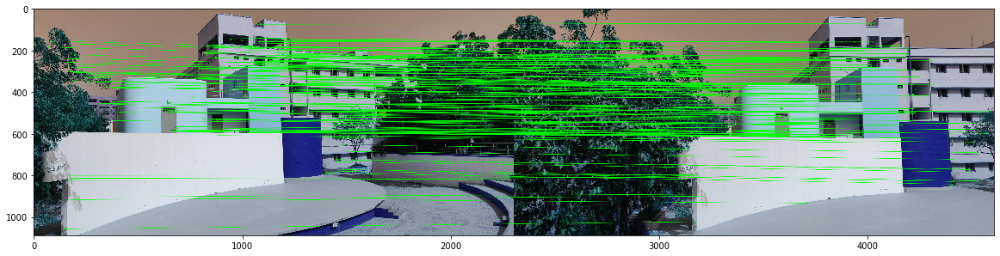

In [71]:
image_path = '../images/Image Mosaicing/'
images_list =  sorted(image_list['1'])
print(images_list)
images = []
for p in images_list:
    images.append(load_image(image_path, p, 0.5))
    
img1 = images[1]
img2 = images[0]

keypoints_1, keypoints_2, good_points = apply_sift_and_find_good_matches(img1, img2, 0.3)
plt.figure(figsize=(20, 20))
draw_matches(img1, keypoints_1, img2, keypoints_2, good_points)

###  2. Computing Homography Matrix

In [53]:
p_left = np.float32([keypoints_1[m.queryIdx].pt for m in good_points]).reshape(-1, 2)
p_right = np.float32([keypoints_2[m.trainIdx].pt for m in good_points]).reshape(-1, 2)
M = find_homography_matrix(p_left, p_right, 20)
print(M)

100%|██████████| 20/20 [00:00<00:00, 1321.71it/s]

Max inliers :  158.0
[[ 7.59242848e-04  2.72936048e-05  9.89149453e-01]
 [-1.43747375e-04  1.11288147e-03  1.46900587e-01]
 [-2.45239229e-07  3.87352060e-09  1.31914423e-03]]


### 3. Transformation of right image using homography matrix

In [67]:
warp_image_img1 = cv2.warpPerspective(img1, M, (img2.shape[1] + img1.shape[1], img2.shape[0] + img1.shape[0]))

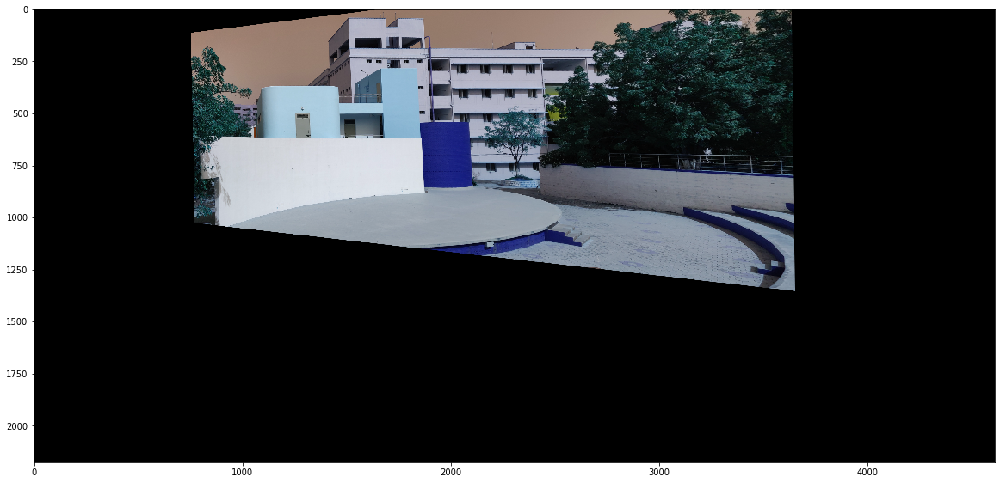

In [69]:
plt.figure(figsize=(20,10))
plt.imshow(warp_image_img1)

### 4. Stitching the two Images and removing complete black rows and columns

100%|██████████| 10/10 [00:00<00:00, 601.75it/s]


Max inliers :  539.0


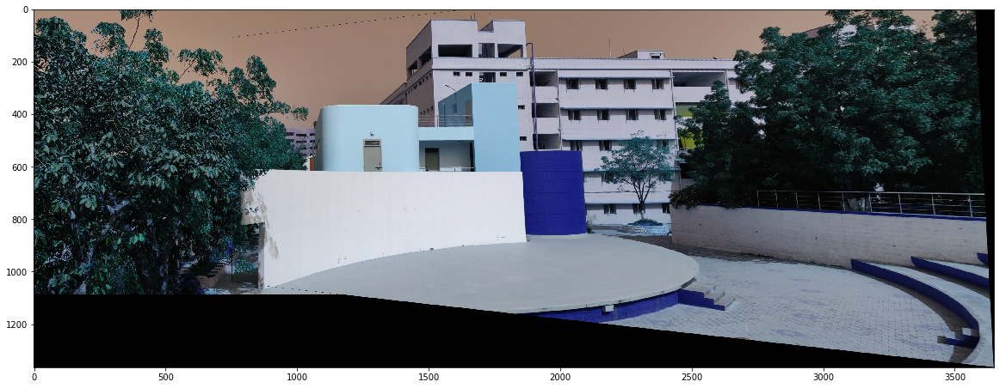

In [52]:
stitched_image = stich_image(img1, img2)
plt.figure(figsize=(20,10))
plt.imshow(stitched_image)

## Stitching images in the given sequence

In [24]:
def stiching(images):
    res = images[0]
    while(len(images)!=1):
        next_img = images[1]
        images.pop(1)
        images.pop(0)
        res = stich_image(next_img, res)
        images.insert(0, res)
    return res

### 5&6. Repeating this for multiple images to produce a singly mosaic/panorama and demonstrating the results on different scenes from the given data.

### Image 1 of Image Mosaicing Directory

100%|██████████| 10/10 [00:00<00:00, 635.83it/s]


Max inliers :  528.0


100%|██████████| 10/10 [00:00<00:00, 27.66it/s]


Max inliers :  444.0


100%|██████████| 10/10 [00:03<00:00,  3.08it/s]


Max inliers :  410.0


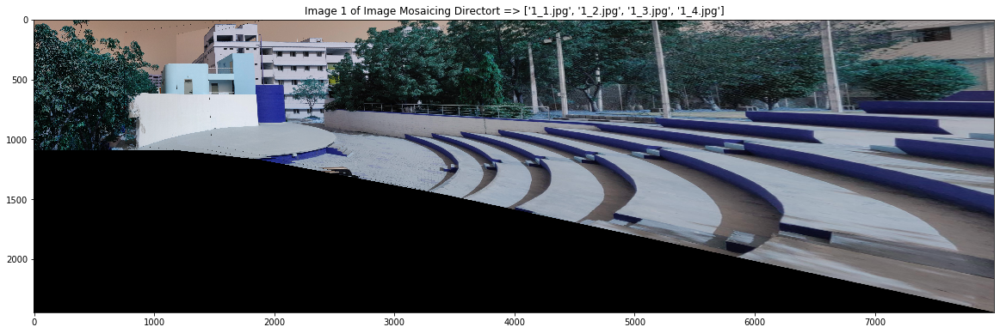

In [25]:
image_path = '../images/Image Mosaicing/'
images_list =  sorted(image_list['1'])
images = []
for p in images_list:
    images.append(load_image(image_path, p, 0.5))

res = stiching(images)
plt.figure(figsize=(20, 10))
plt.title("Image 1 of Image Mosaicing Directory => " + str(images_list))
plt.imshow(res)

### Image 2 of Image Mosaicing Directory

In [27]:
image_path = '../images/Image Mosaicing/'
# images_list =  ['2_1.png', '2_2.png', '2_3.png', '2_4.png']
images_list = sorted(image_list['2'])
print(images_list)
images = []
for p in images_list:
    images.append(load_image(image_path, p, 1))
    
res = stiching(images)

['2_1.png', '2_2.png', '2_3.png', '2_4.png', '2_5.png', '2_6.png']


100%|██████████| 10/10 [00:00<00:00, 823.27it/s]


Max inliers :  1048.0


100%|██████████| 10/10 [00:00<00:00, 1064.38it/s]


Max inliers :  730.0


100%|██████████| 10/10 [00:00<00:00, 296.31it/s]


Max inliers :  484.0


100%|██████████| 10/10 [00:00<00:00, 789.44it/s]


Max inliers :  1116.0


100%|██████████| 10/10 [00:00<00:00, 760.24it/s]

Max inliers :  1179.0


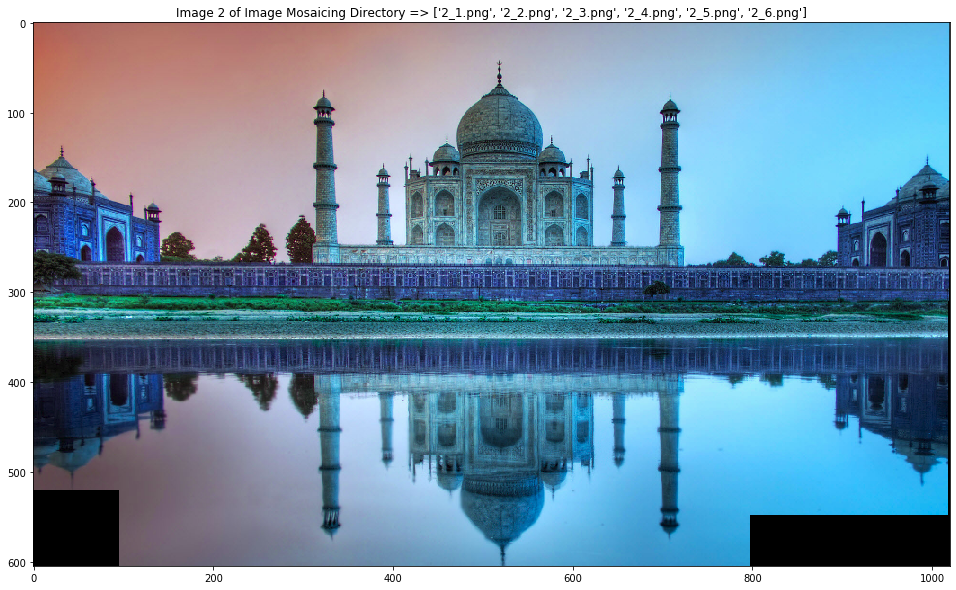

In [28]:
plt.figure(figsize=(20, 10))
plt.title("Image 2 of Image Mosaicing Directory => " + str(images_list))
plt.imshow(res)

### Image 3 of Image Mosaicing Directory

In [29]:
image_path = '../images/Image Mosaicing/'
images_list =  sorted(image_list['3'])
images = []
for p in images_list:
    images.append(load_image(image_path, p, 1))
    
res = stiching(images)

100%|██████████| 10/10 [00:00<00:00, 1196.53it/s]

Max inliers :  109.0


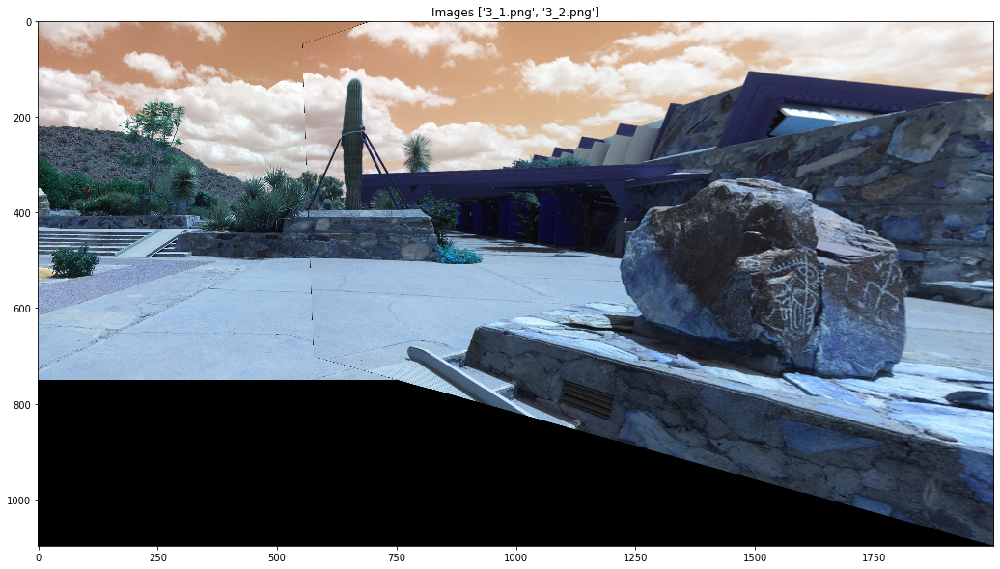

In [30]:
plt.figure(figsize=(20, 10))
plt.title("Image 3 of Image Mosaicing Directory => " + str(images_list))
plt.imshow(res)

### Image 4 of Image Mosaicing Directory

100%|██████████| 10/10 [00:00<00:00, 1701.47it/s]

Max inliers :  4.0


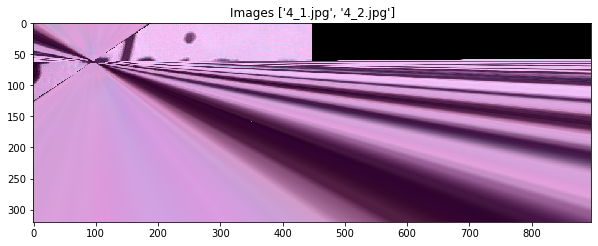

In [40]:
image_path = '../images/Image Mosaicing/'
images_list =  sorted(image_list['4'])
images = []
for p in images_list:
    images.append(load_image(image_path, p, 1))
# print(images_list)
# stitcher = cv2.createStitcher()
# st, res = stitcher.stitch(images)
res = stiching(images)
plt.figure(figsize=(10, 10))
plt.title("Image 4 of Image Mosaicing Directory => " + str(images_list))
plt.imshow(res)

41


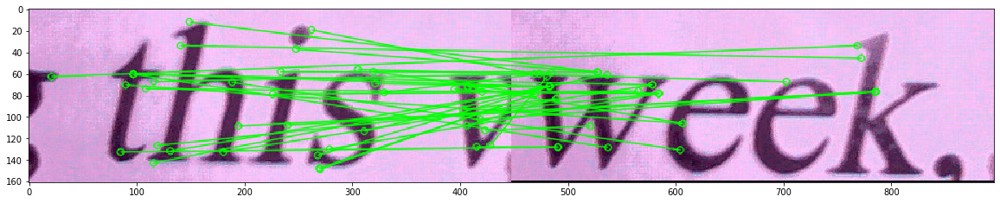

In [48]:
image_path = '../images/Image Mosaicing/'
images_list =  sorted(image_list['4'])
images = []
for p in images_list:
    images.append(load_image(image_path, p, 1))
    
img1 = images[0]
img2 = images[1]

keypoints_1, keypoints_2, good_points = apply_sift_and_find_good_matches(img1, img2, 0.9)
print(len(good_points))
draw_parameters = dict(matchColor = (0, 255, 0), singlePointColor=None, flags=2)
plt.figure(figsize=(20, 10))
img3 = cv2.drawMatches(img1, keypoints_1, img2, keypoints_2, good_points, None, **draw_parameters)
plt.imshow(img3)

Observations:
    1. There are very less matched points that are correctly matched in both the images. Most of them 
    are incorrectly matched.
    
    2. In text images, generally we don't get enough good_points to calculate the homography matrix.
    
    3. The above image is like this because of above two points.

### Image 5 of Image Mosaicing Directory

In [31]:
image_path = '../images/Image Mosaicing/'
images_list =  sorted(image_list['5'])
images = []
for p in images_list:
    images.append(load_image(image_path, p, 0.25))
    
res = stiching(images)

100%|██████████| 10/10 [00:00<00:00, 1046.61it/s]


Max inliers :  661.0


100%|██████████| 10/10 [00:00<00:00, 1161.79it/s]


Max inliers :  438.0


100%|██████████| 10/10 [00:00<00:00, 504.68it/s]

Max inliers :  655.0


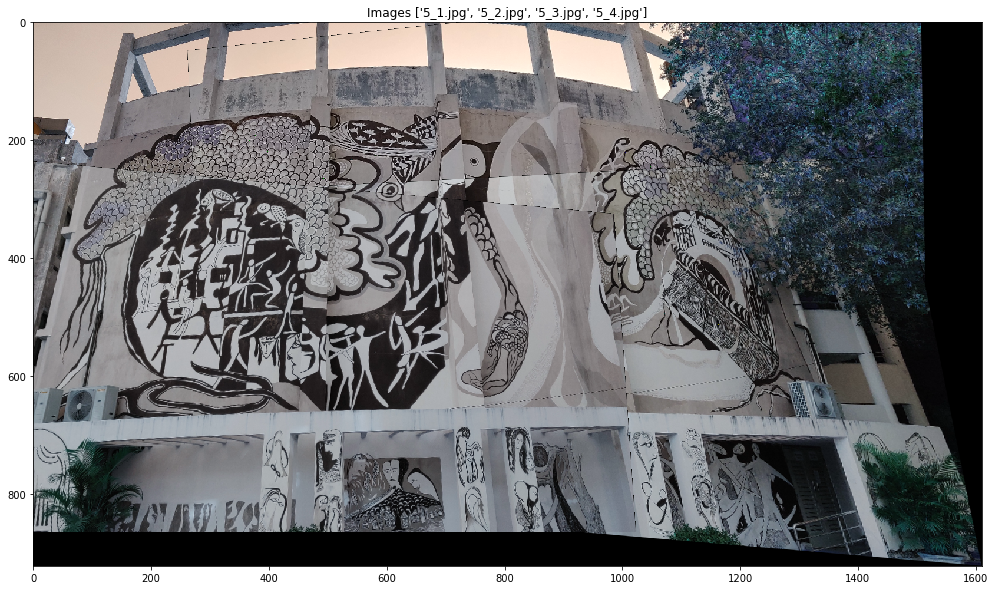

In [32]:
plt.figure(figsize=(20, 10))
plt.title("Image 5 of Image Mosaicing Directory => " + str(images_list))
plt.imshow(res)

### 7. Additionally, capture a set of overlapping images of a scene with your camera and report the results on the same.

### Images taken by me present in "images/My Images" Directory

In [33]:
image_path = '../images/My Images/'
images_list =  ['1.jpeg', '2.jpeg', '3.jpeg', '4.jpeg']
images = []
for p in images_list:
    images.append(load_image(image_path, p, 0.5))
    
res = stiching(images)

100%|██████████| 10/10 [00:00<00:00, 1314.46it/s]


Max inliers :  332.0


100%|██████████| 10/10 [00:00<00:00, 1550.35it/s]


Max inliers :  254.0


100%|██████████| 10/10 [00:00<00:00, 1636.35it/s]

Max inliers :  101.0


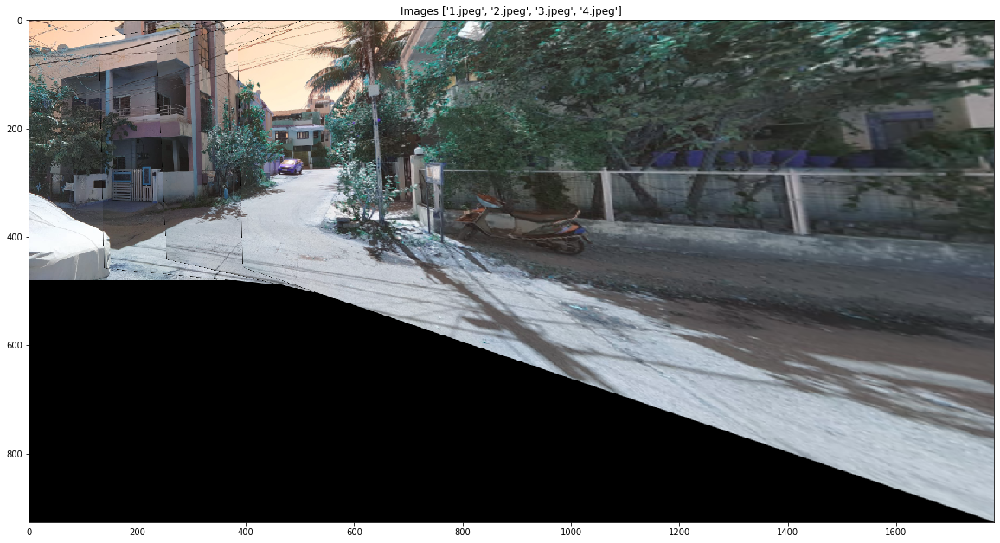

In [34]:
plt.figure(figsize=(20, 20))
plt.title("Image taken by me present in \"images/My Images\" Directory => " + str(images_list))
plt.imshow(res)

In [49]:
cv2.imshow("res", res)
cv2.waitKey(0)  
cv2.destroyAllWindows()

### 8. Bonus : Stitching images given in any order without human intervention

In [180]:
from copy import deepcopy
def find_matches(ind, images):
    c=0
    for i in range(len(images)):
        if(i!=ind):
            _, _, good_points = apply_sift_and_find_good_matches(images[ind], images[i], 0.5)
            c += len(good_points)
    
    return c

def find_base_image(images):
    base_ind = 0
    max_matches = 0
    for i in range(len(images)):
        matches = find_matches(i, images)
        if(matches > max_matches):
            base_ind = i
            max_matches = matches
            
    return base_ind

def find_best_matched_image(ind, images):
    image_ind = 0
    max_matches = 0
    flag1 = False
    for i in range(len(images)):
        if(i!=ind):
            flag = False
            _, _, good_points1 = apply_sift_and_find_good_matches(images[ind], images[i], 0.3)
            _, _, good_points2 = apply_sift_and_find_good_matches(images[i], images[ind], 0.3)
            len1 = len(good_points1)
            len2 = len(good_points2)
            length = len1
            if(len1 > len2):
                length = len1
                flag=True
            else:
                length = len2
                flag=False
            
            matches = length 
            if(matches > max_matches):
                image_ind = i
                max_matches = matches
                flag1 = flag
            
    return image_ind, flag1


def stitching_unordered(path):
    images_list =  os.listdir(path)
    print(images_list)
    images = []
    for p in images_list:
        images.append(load_image(path, p, 1))
    
    base_ind = find_base_image(images)
    res = images[base_ind]
    
#     all_result = []
#     all_result.append(deepcopy(res))
    while(len(images)!=1):
        print(len(images))
        next_img_ind, flag = find_best_matched_image(base_ind, images)
        next_image = images[next_img_ind]
#         all_result.append(deepcopy(next_image))
        if next_img_ind < base_ind:
            images.pop(base_ind)
            images.pop(next_img_ind)
        else:
            images.pop(next_img_ind)
            images.pop(base_ind)
            
#         if(not flag):
#         print(flag)
        res = stich_image(next_image, res)
#         else:
#         res = stich_image(res, next_image)
#         all_result.append(deepcopy(res))
        images.insert(0, res)
        base_ind = 0
        
#     print(flag)
    return res

In [181]:
path = '../images/Image Mosaicing/3'
res = stitching_unordered(path)

['3_1.png', '3_2.png']
2


100%|██████████| 10/10 [00:00<00:00, 1135.65it/s]

Max inliers :  139.0


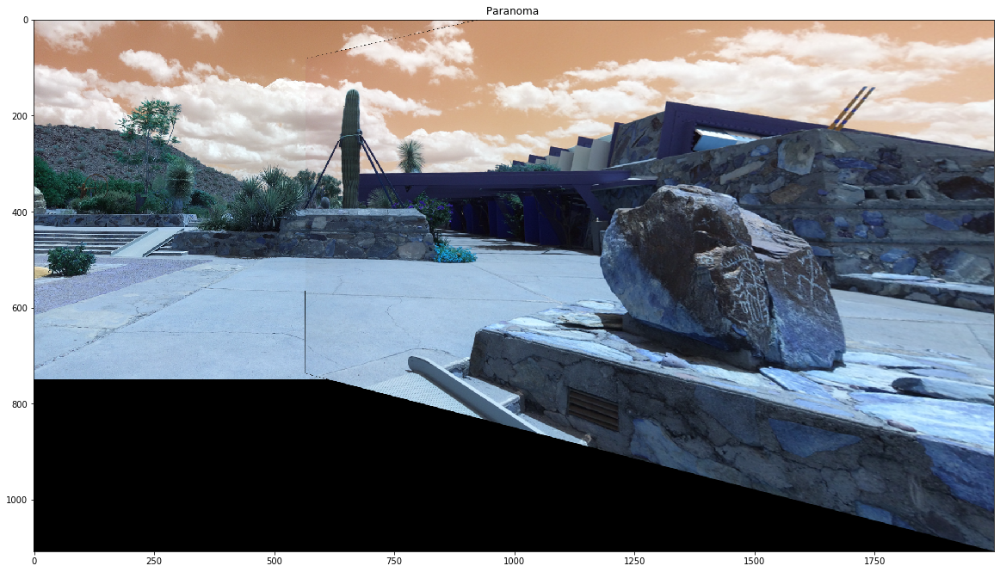

In [182]:
plt.figure(figsize=(20, 20))
plt.title("Paranoma ")
plt.imshow(res)

# 2. Stereo Correspondence

In [494]:
!ls ../images/Stereo\ Correspondence
image_names = {1:['1_1.jpg', '1_2.jpg'], 2: ['2_1.png', '2_2.png'], 3:['3_1.jpg', '3_2.jpg']}

1_1.jpg  1_2.jpg  2_1.png  2_2.png  3_1.jpg  3_2.jpg


### Function for loading images 

In [634]:
def load_image_sc(imgname, scale):
    img = cv2.imread('../images/Stereo Correspondence/'+imgname)
    img = cv2.resize(img, (int(img.shape[1] * scale), int(img.shape[0] * scale)))
    return img

### Function for brute force of Intensity window-based correlation on the given pair of images.

    
    For Intensity Window based matching brute-force, we define the window size and stride and compared patch by patch from image1 to image2.

In [637]:
def image_fit_window(img1, img2, w):
    h1, w1, _ = img1.shape
    h2, w2, _ = img2.shape
    
    new_h1 = (h1//w)*w
    new_h2 = (h2//w)*w
    new_w1 = (w1//w)*w
    new_w2 = (w2//w)*w
    
    img1 = cv2.resize(img1,(new_h1, new_w1)) 
    img2 = cv2.resize(img2,(new_h2, new_w2))
                      
    return img1, img2

def matching_brute_force(img1, img2, ws, stride):   
    img1, img2 = image_fit_window(img1, img2, ws)
    #normalization
    img1 = img1 / img1.max()
    img2 = img2 / img2.max()
    
    h1, w1, _ = img1.shape
    h2, w2, _ = img2.shape
    
                      
    best_matches = []
    
    for y1 in range(0,h1, ws):
        for x1 in range(0,w1, ws):
            min_dis = np.inf
            corrd = None       
            for y2 in range(0,h2-ws, stride):
                for x2 in range(0,w2-ws, stride):
                      
                    v1 = img1[y1:y1+ws, x1:x1+ws,:]
                    v2 = img2[y2:y2+ws, x2:x2+ws,:]
                    v1 = v1.flatten()
                    v2 = v2.flatten()
                    dis = np.linalg.norm(v1-v2)
                    
                    if dis < min_dis:
                        min_dis = dis
                        corrd = [x1,y1,x2,y2]
                        
            best_matches.append(corrd)
            
    return best_matches

In [638]:
def draw_matches(img, matches, ws):
    h,w,c = img.shape
    for match in matches[:20]:
        pt1 = (int(match[1])+ws//2,int(match[0])+ws//2)
        pt2 = (int(match[3])+ws//2+w//2,int(match[2])+ ws//2)
        color = tuple(np.random.randint(0,255,3).tolist())
        line_img = cv2.line(img,pt1,pt2,color,1)
    
    return line_img

### 1. Perform Intensity window-based correlation on the given pair of images.

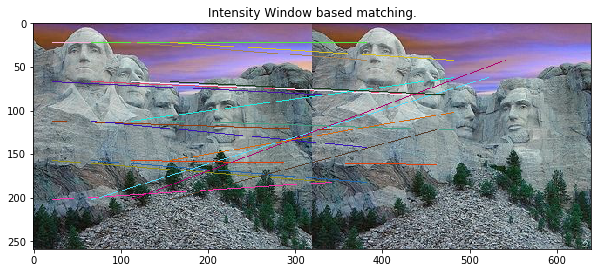

In [639]:
img1 = load_image_sc(image_names[1][0], 1)
img2 = load_image_sc(image_names[1][1], 1)
img3 = np.concatenate((img1, img2), axis = 1)

matches = np.array(matching_brute_force(img1, img2, 45, 20))

dis_img = draw_matches(img3, matches, 45)
plt.figure(figsize=(10, 10))
plt.title("Intensity Window based matching.")
plt.imshow(dis_img)

### Function to draw Epipolar lines

    To draw epipolar lines we used sift features from scratch not in built functions

In [646]:
def drawlines(img1,lines):
    _,c,_ = img1.shape
    
    for r in lines:
        color = tuple(np.random.randint(0,255,3).tolist())
        x0,y0 = map(int, [0, -r[2]/r[1] ])
        x1,y1 = map(int, [c, -(r[2]+r[0]*c)/r[1] ])
        img1 = cv2.line(img1, (x0,y0), (x1,y1), color,1)
    return img1


def find_epipolar_lines(img1, img2):
    sift = cv2.xfeatures2d.SIFT_create()

    kp1, des1 = sift.detectAndCompute(img1,None)
    kp2, des2 = sift.detectAndCompute(img2,None)

    # FLANN parameters
    index_params = dict(algorithm = 0, trees = 5)
    search_params = dict(checks=50)

    flann = cv2.FlannBasedMatcher(index_params,search_params)
    matches = flann.knnMatch(des1,des2,k=2)
    
    pts1 = []
    pts2 = []

    for i,(m,n) in enumerate(matches):
        if m.distance < 0.72*n.distance:
            pts2.append(kp2[m.trainIdx].pt)
            pts1.append(kp1[m.queryIdx].pt)
    
    pts1 = np.int32(pts1)
    pts2 = np.int32(pts2)
    F, mask = cv2.findFundamentalMat(pts1,pts2,cv2.FM_LMEDS)

    pts1 = pts1[mask.ravel()==1]
    pts2 = pts2[mask.ravel()==1]
    
    p1_1 = np.hstack((pts1, np.ones((pts1.shape[0], 1))))
    p2_1 = np.hstack((pts1, np.ones((pts1.shape[0], 1))))
    
    EL1 = F @ p2_1.T
    EL2 = F.T @ p1_1.T

    return EL1.T, EL2.T

### 2. Select few points in the first image and then plot their corresponding epipolar lines on the second.

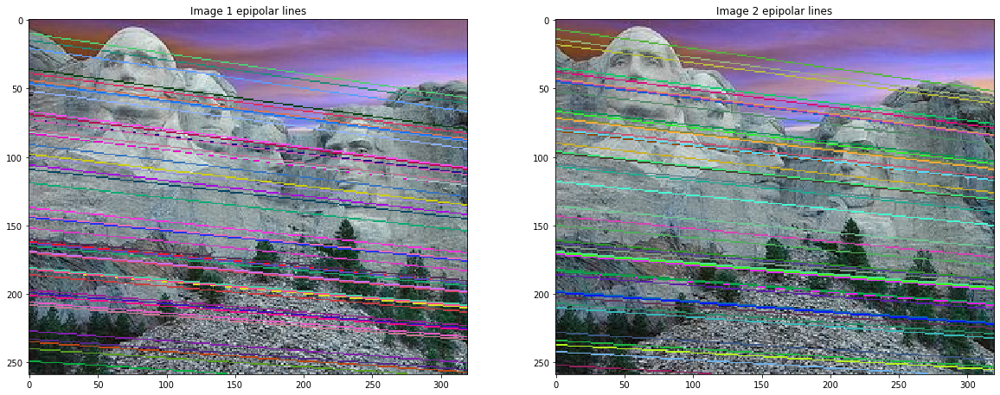

In [647]:
img1 = load_image_sc(image_names[1][1], 1) 
img2 = load_image_sc(image_names[1][0], 1)

ep1, ep2 = find_epipolar_lines(img1, img2)
img1_ = drawlines(img1.copy(), ep1[:50])
img2_ = drawlines(img2.copy(), ep2[:50])
plt.figure(figsize=(20, 20))
plt.subplot(121),plt.title("Image 1 epipolar lines"), plt.imshow(img1_)
plt.subplot(122),plt.title("Image 2 epipolar lines"), plt.imshow(img2_)
plt.show()

### Function for Rectification

In [643]:
def rectification(img1, img2):
    sift = cv2.xfeatures2d.SIFT_create()

    kp1, des1 = sift.detectAndCompute(img1,None)
    kp2, des2 = sift.detectAndCompute(img2,None)

    # FLANN parameters
    index_params = dict(algorithm = 0, trees = 5)
    search_params = dict(checks=50)

    flann = cv2.FlannBasedMatcher(index_params,search_params)
    matches = flann.knnMatch(des1,des2,k=2)
    
    pts1 = []
    pts2 = []

    for i,(m,n) in enumerate(matches):
        if m.distance < 0.72*n.distance:
            pts2.append(kp2[m.trainIdx].pt)
            pts1.append(kp1[m.queryIdx].pt)
    
    pts1 = np.int32(pts1)
    pts2 = np.int32(pts2)
    F, mask = cv2.findFundamentalMat(pts1,pts2,cv2.FM_LMEDS)

    pts1 = pts1[mask.ravel()==1]
    pts2 = pts2[mask.ravel()==1]

    _, H1, H2 = cv2.stereoRectifyUncalibrated(pts1, pts2, F, (img1.shape[1], img1.shape[0]))

    #rectification
    img1_rectified = cv2.warpPerspective(img1, H1, (img1.shape[1], img1.shape[0]))
    img2_rectified = cv2.warpPerspective(img2, H2, (img1.shape[1], img1.shape[0]))
    
    return img1_rectified, img2_rectified

### 3. Rectify the pair of images and on these new images, find the correspondences using greedy matching.

### Rectification

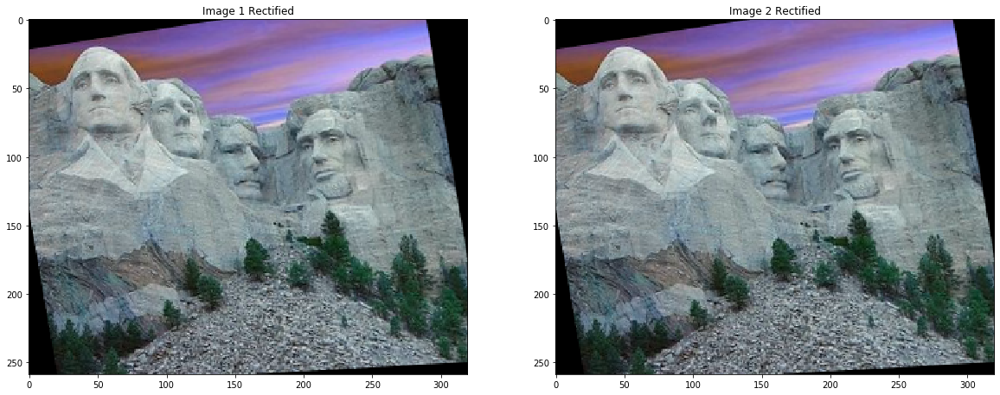

In [648]:
img1 = load_image_sc(image_names[1][1], 1) 
img2 = load_image_sc(image_names[1][0], 1)

img1_rectified, img2_rectified = rectification(img1.copy(), img2.copy())
plt.figure(figsize=(20, 20))
plt.subplot(121),plt.title("Image 1 Rectified"), plt.imshow(img1_rectified)
plt.subplot(122),plt.title("Image 2 Rectified"), plt.imshow(img1_rectified)
plt.show()

In [664]:
#on the same row
def matching_greedy(img1, img2, ws, stride):   
    img1, img2 = image_fit_window(img1, img2, ws)
    #normalization
    img1 = img1 / img1.max()
    img2 = img2 / img2.max()
    
    h1, w1, _ = img1.shape
    h2, w2, _ = img2.shape
    
                      
    best_matches = []
    
    for y1 in range(0,h1, ws):
        for x1 in range(0,w1, ws):
            min_dis = np.inf
            corrd = None       
            
            for x2 in range(0,w2-ws, stride):
                y2 = y1
                v1 = img1[y1:y1+ws, x1:x1+ws,:]
                v2 = img2[y2:y2+ws, x2:x2+ws,:]
                v1 = v1.flatten()
                v2 = v2.flatten()
                dis = np.linalg.norm(v1-v2)

                if dis < min_dis:
                    min_dis = dis
                    corrd = [x1,y1,x2,y2]
                        
            best_matches.append(corrd)
            
    return best_matches

### Using greedy matching

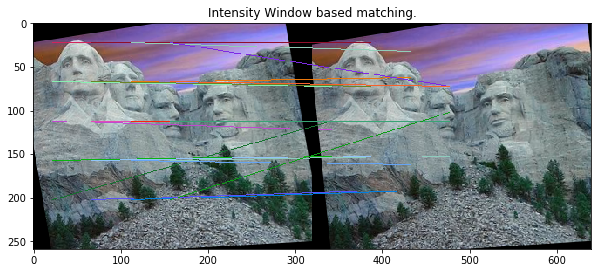

In [653]:
img3 = np.concatenate((img1_rectified, img2_rectified), axis = 1)
matches = np.array(matching_greedy(img1_rectified, img2_rectified, 45, 10))

def draw_matches(img, matches, ws):
    h,w,c = img.shape
    for match in matches[:20]:
        pt1 = (int(match[1])+ws//2,int(match[0])+ws//2)
        pt2 = (int(match[3])+ws//2+w//2,int(match[2])+ ws//2)
        color = tuple(np.random.randint(0,255,3).tolist())
        line_img = cv2.line(img,pt1,pt2,color,1)
    
    return line_img

dis_img = draw_matches(img3, matches, 45)
plt.figure(figsize=(10, 10))
plt.title("Intensity Window based matching.")
plt.imshow(dis_img)

### Bonus :  Using SIFT

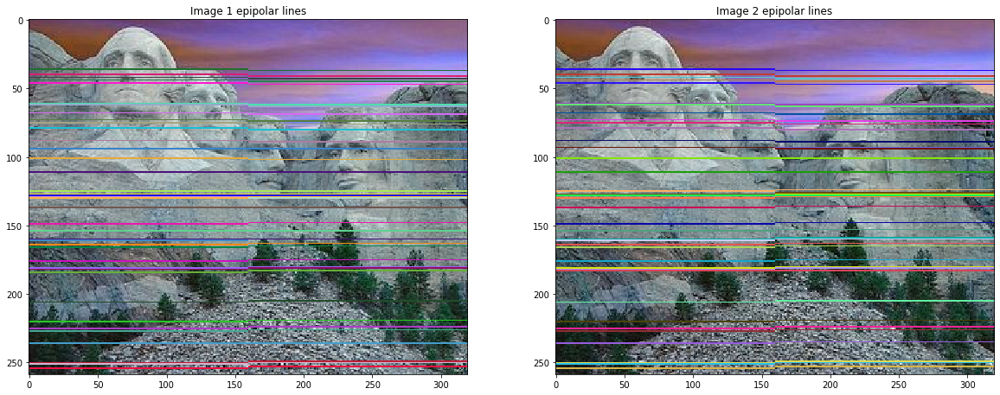

In [649]:
ep1, ep2 = find_epipolar_lines(img1_rectified, img2_rectified)
img1_ = drawlines(img1.copy(), ep1[:50])
img2_ = drawlines(img2.copy(), ep2[:50])
plt.figure(figsize=(20, 20))
plt.subplot(121),plt.title("Image 1 epipolar lines"), plt.imshow(img1_)
plt.subplot(122),plt.title("Image 2 epipolar lines"), plt.imshow(img2_)
plt.show()

### Image 2

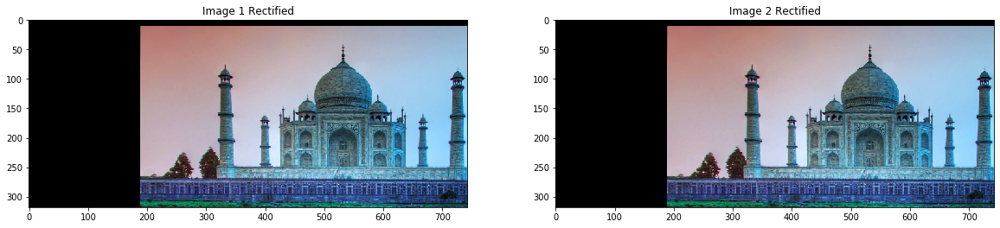

In [661]:
img1 = load_image_sc(image_names[2][1], 1) 
img2 = load_image_sc(image_names[2][0], 1)
img2 = cv2.resize(img2, (img1.shape[1], img1.shape[0]))
img1_rectified, img2_rectified = rectification(img1.copy(), img2.copy())
plt.figure(figsize=(20, 20))
plt.subplot(121),plt.title("Image 1 Rectified"), plt.imshow(img1_rectified)
plt.subplot(122),plt.title("Image 2 Rectified"), plt.imshow(img1_rectified)
plt.show()

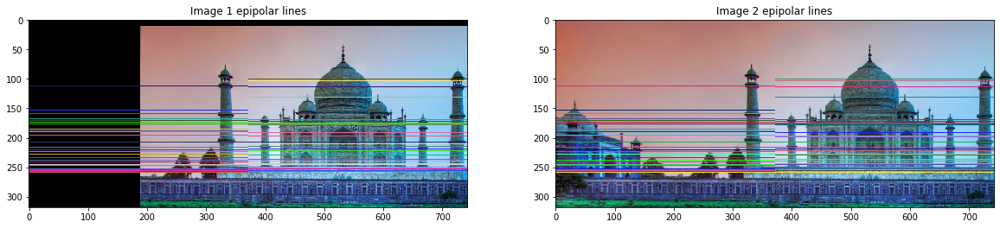

In [662]:
ep1, ep2 = find_epipolar_lines(img1_rectified, img2_rectified)
img1_ = drawlines(img1_rectified.copy(), ep1[:50])
img2_ = drawlines(img2_rectified.copy(), ep2[:50])
plt.figure(figsize=(20, 20))
plt.subplot(121),plt.title("Image 1 epipolar lines"), plt.imshow(img1_)
plt.subplot(122),plt.title("Image 2 epipolar lines"), plt.imshow(img2_)
plt.show()

### Image 3

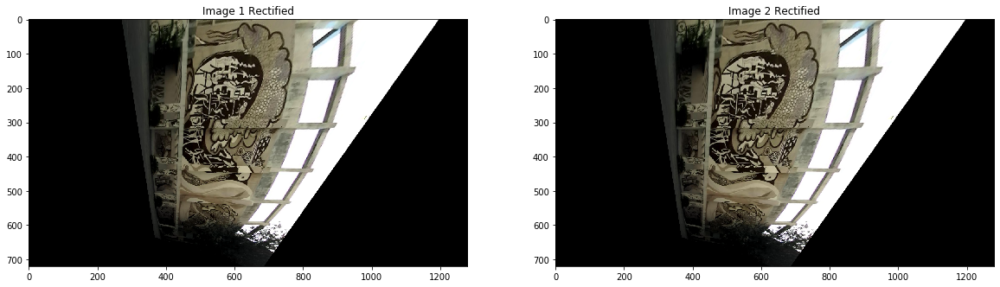

In [658]:
img1 = load_image_sc(image_names[3][1], 1) 
img2 = load_image_sc(image_names[3][0], 1)
img2 = cv2.resize(img2, (img1.shape[1], img1.shape[0]))
img1_rectified, img2_rectified = rectification(img1.copy(), img2.copy())
plt.figure(figsize=(20, 20))
plt.subplot(121),plt.title("Image 1 Rectified"), plt.imshow(img1_rectified)
plt.subplot(122),plt.title("Image 2 Rectified"), plt.imshow(img1_rectified)
plt.show()

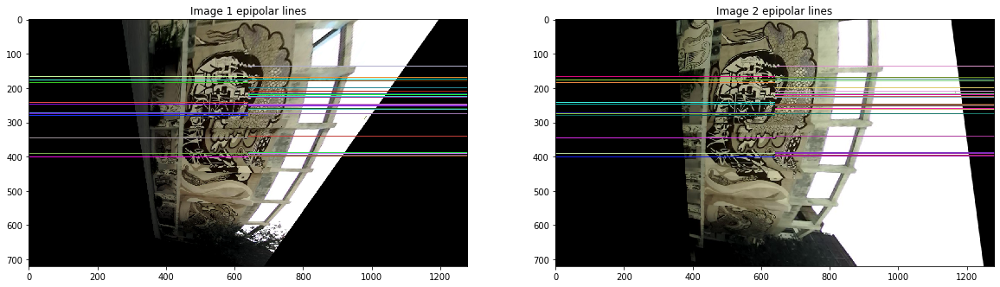

In [660]:
ep1, ep2 = find_epipolar_lines(img1_rectified, img2_rectified)
img1_ = drawlines(img1_rectified.copy(), ep1[:50])
img2_ = drawlines(img2_rectified.copy(), ep2[:50])
plt.figure(figsize=(20, 20))
plt.subplot(121),plt.title("Image 1 epipolar lines"), plt.imshow(img1_)
plt.subplot(122),plt.title("Image 2 epipolar lines"), plt.imshow(img2_)
plt.show()

### 4. Compare the Brute force and Greedy based solution for the stereo correspondence problem.

   Observations:
   
      1. brute force takes more time and is slow.
      
      2. with greedy we get much better results and it is faster because 
      instead of searching for whole we search along the line.
      
      3. SIFT gives more accurate results than Intensity window-based correlation.